In [ ]:
from typing import Dict

from tempfile import gettempdir
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from torch import nn, optim
from torch.utils.data import DataLoader
from torchvision.models.resnet import resnet34
from tqdm import tqdm

from l5kit.configs import load_config_data
from l5kit.data import LocalDataManager, ChunkedDataset
from l5kit.dataset import AgentDataset, EgoDataset
from l5kit.rasterization import build_rasterizer
from l5kit.evaluation import write_pred_csv, compute_metrics_csv, read_gt_csv, create_chopped_dataset
from l5kit.evaluation.chop_dataset import MIN_FUTURE_STEPS
from l5kit.evaluation.metrics import neg_multi_log_likelihood, time_displace
from l5kit.geometry import transform_points
from l5kit.visualization import PREDICTED_POINTS_COLOR, TARGET_POINTS_COLOR, draw_trajectory
from prettytable import PrettyTable
from pathlib import Path

from torch import Tensor



import os

## Prepare Data path and load cfg

By setting the `L5KIT_DATA_FOLDER` variable, we can point the script to the folder where the data lies.

Then, we load our config file with relative paths and other configurations (rasteriser, training params...).

In [ ]:
DEBUG = False

# training cfg
validation_cfg = {
    
    'format_version': 4,
    
     ## Model options
    'model_params': {
        'model_architecture': 'resnet34',
        'history_num_frames': 10,
        'history_step_size': 1,
        'history_delta_time': 0.1,
        'future_num_frames': 50,
        'future_step_size': 1,
        'future_delta_time': 0.1,
    },

    ## Input raster parameters
    'raster_params': {
        
        'raster_size': [224, 224], # raster's spatial resolution [meters per pixel]: the size in the real world one pixel corresponds to.
        'pixel_size': [0.5, 0.5], # From 0 to 1 per axis, [0.5,0.5] would show the ego centered in the image.
        'ego_center': [0.25, 0.5],
        'map_type': "py_semantic",
        
        # the keys are relative to the dataset environment variable
        'satellite_map_key': "aerial_map/aerial_map.png",
        'semantic_map_key': "semantic_map/semantic_map.pb",
        'dataset_meta_key': "meta.json",

        # e.g. 0.0 include every obstacle, 0.5 show those obstacles with >0.5 probability of being
        # one of the classes we care about (cars, bikes, peds, etc.), >=1.0 filter all other agents.
        'filter_agents_threshold': 0.5
    },

    ## Data loader options
    'valid_data_loader': {
        'key': "scenes/validate_chopped_100/validate.zarr",
        'batch_size': 1,
        'shuffle': False,
        'num_workers': 0
    },

    ## Valid params
    'valid_params': {
        'checkpoint_every_n_steps': 5000,
        'max_num_steps': 10 if DEBUG else 1000
    }
}

common_cfg = {
    'seed': 500,
    'output_dir': './outputs/1011_2/',
    'epoch': 2,
    'train_step': 5 if DEBUG else 500,
    'valid_step': 5 if DEBUG else 50,
    'train_max': 12,
    'learning_rate': 1e-3
}


In [ ]:
OUTPUT_DIR = common_cfg['output_dir']
INPUT_ROOT = Path('/home/knikaido/work/Lyft/data/')
DATA_DIR = INPUT_ROOT / 'lyft-motion-prediction-autonomous-vehicles/'

In [37]:
# set env variable for data
os.environ["L5KIT_DATA_FOLDER"] =str(DATA_DIR)
dm = LocalDataManager(None)
# get config
# cfg = load_config_data("./agent_motion_config.yaml")
cfg = validation_cfg
print(cfg)

{'format_version': 4, 'model_params': {'model_architecture': 'resnet34', 'history_num_frames': 10, 'history_step_size': 1, 'history_delta_time': 0.1, 'future_num_frames': 50, 'future_step_size': 1, 'future_delta_time': 0.1}, 'raster_params': {'raster_size': [224, 224], 'pixel_size': [0.5, 0.5], 'ego_center': [0.25, 0.5], 'map_type': 'py_semantic', 'satellite_map_key': 'aerial_map/aerial_map.png', 'semantic_map_key': 'semantic_map/semantic_map.pb', 'dataset_meta_key': 'meta.json', 'filter_agents_threshold': 0.5}, 'valid_data_loader': {'key': 'scenes/validate_chopped_100/validate.zarr', 'batch_size': 1, 'shuffle': False, 'num_workers': 0}, 'valid_params': {'checkpoint_every_n_steps': 5000, 'max_num_steps': 1000}}


In [38]:
pd.set_option('display.max_columns', 100)

In [39]:
def outs(conf, outputs):

    most_outputs = []
    confs = []
    for i in tqdm(range(len(output))):
        index = np.argmax(conf.iloc[i].values)
        most_conf = np.max(conf.iloc[i].values)
        most_output = outputs[index].iloc[i].values
        confs.append(most_conf)
        most_outputs.append(most_output)
        
    return confs, most_outputs

#     if(i==2): break

In [86]:
output = pd.read_csv(str(OUTPUT_DIR)+'pred_1010.csv')
output.head(10)

,timestamp,track_id,conf_0,conf_1,conf_2,coord_x00,coord_y00,coord_x01,coord_y01,coord_x02,coord_y02,coord_x03,coord_y03,coord_x04,coord_y04,coord_x05,coord_y05,coord_x06,coord_y06,coord_x07,coord_y07,coord_x08,coord_y08,coord_x09,coord_y09,coord_x010,coord_y010,coord_x011,coord_y011,coord_x012,coord_y012,coord_x013,coord_y013,coord_x014,coord_y014,coord_x015,coord_y015,coord_x016,coord_y016,coord_x017,coord_y017,coord_x018,coord_y018,coord_x019,coord_y019,coord_x020,coord_y020,coord_x021,coord_y021,coord_x022,...,coord_x225,coord_y225,coord_x226,coord_y226,coord_x227,coord_y227,coord_x228,coord_y228,coord_x229,coord_y229,coord_x230,coord_y230,coord_x231,coord_y231,coord_x232,coord_y232,coord_x233,coord_y233,coord_x234,coord_y234,coord_x235,coord_y235,coord_x236,coord_y236,coord_x237,coord_y237,coord_x238,coord_y238,coord_x239,coord_y239,coord_x240,coord_y240,coord_x241,coord_y241,coord_x242,coord_y242,coord_x243,coord_y243,coord_x244,coord_y244,coord_x245,coord_y245,coord_x246,coord_y246,coord_x247,coord_y247,coord_x248,coord_y248,coord_x249,coord_y249
0,1576254980902731486,1,0.361312,0.228528,0.410160,0.01735,0.02580,-0.01591,0.05170,-0.02375,0.00407,-0.06321,-0.03824,-0.06670,-0.04751,-0.07326,-0.04164,-0.05361,-0.02497,-0.05293,0.01041,-0.04310,0.04023,-0.02911,0.03536,-0.01294,0.02340,-0.00791,0.02597,-0.02121,0.06245,-0.03789,0.10209,-0.03964,0.13692,-0.02562,0.13935,-0.04098,0.14273,-0.06588,0.17070,-0.09679,0.20379,-0.12450,0.24211,-0.17701,0.31830,-0.22184,0.38492,-0.29384,...,-0.04349,0.08018,-0.04668,0.09202,-0.06580,0.11146,-0.07760,0.13701,-0.10125,0.15220,-0.12449,0.18422,-0.14474,0.23368,-0.17212,0.28091,-0.21810,0.35619,-0.24178,0.39544,-0.27019,0.45761,-0.30711,0.53161,-0.32768,0.58252,-0.33178,0.62674,-0.35373,0.69442,-0.38200,0.76765,-0.42398,0.85816,-0.46640,0.91649,-0.48399,0.99418,-0.48760,1.05602,-0.52660,1.12589,-0.57589,1.22539,-0.63955,1.33656,-0.69382,1.43667,-0.70700,1.51192
1,1576254980902731486,5,0.017813,0.003310,0.978877,0.00394,0.00905,0.01094,-0.01517,0.00584,-0.02339,0.01569,-0.07020,0.02407,-0.07061,-0.01154,-0.09298,-0.03724,-0.08340,-0.05524,-0.08501,-0.05985,-0.07956,-0.08320,-0.08513,-0.10267,-0.07976,-0.11568,-0.08822,-0.13623,-0.09620,-0.14696,-0.10385,-0.16904,-0.09320,-0.18905,-0.08451,-0.17658,-0.08489,-0.18308,-0.09279,-0.18559,-0.11188,-0.18528,-0.12459,-0.21527,-0.15664,-0.22617,-0.16979,-0.25367,...,0.12864,0.09600,0.13028,0.10122,0.13629,0.10648,0.13809,0.10160,0.15648,0.10368,0.15291,0.09582,0.16060,0.10105,0.16118,0.09686,0.13800,0.08270,0.15256,0.08120,0.15967,0.08853,0.15588,0.08830,0.15245,0.09340,0.17621,0.10180,0.17808,0.10788,0.17212,0.10322,0.17684,0.09381,0.19053,0.10066,0.20510,0.10670,0.20764,0.11279,0.20968,0.11050,0.21649,0.10422,0.22449,0.10847,0.23998,0.10199,0.25310,0.10043
2,1576254980902731486,188,0.109758,0.032122,0.858120,0.60472,0.21259,1.19901,0.48204,1.97950,0.88756,2.46831,1.43723,3.11317,1.71520,3.77170,1.88950,4.36378,2.02906,4.95208,2.17992,5.49369,2.25804,5.99845,2.37747,6.50954,2.42758,7.02581,2.50419,7.55246,2.62359,8.03349,2.71833,8.49359,2.72225,8.96244,2.75260,9.29360,2.78284,9.71564,2.85064,10.10610,2.94057,10.50124,2.96598,10.91495,3.07006,11.38164,3.10882,11.80260,...,11.16403,0.35801,11.46230,0.14969,11.77533,-0.10571,12.09323,-0.35390,12.36606,-0.65384,12.57976,-0.94683,12.81039,-1.32265,13.06014,-1.65625,13.30770,-2.02062,13.52490,-2.39633,13.80571,-2.75400,14.01349,-3.14163,14.23615,-3.46123,14.39998,-3.83634,14.58497,-4.26793,14.71235,-4.65747,15.04867,-5.07754,15.24220,-5.50310,15.43657,-5.95482,15.65853,-6.38721,15.86273,-6.83709,16.04606,-7.26266,16.32291,-7.60691,16.46669,-8.03075,16.70173,-8.49984
3,1576255051602228134,1,0.520193,0.199972,0.279836,0.69259,0.99906,1.35476,2.01012,2.00345,3.05639,2.64300,4.08600,3.28937,5.08791,3.97961,6.10654,4.69542,7.15334,5.35082,8.16751,6.02589,9.20734,6.73230,10.24570,7.40637,11.24685,8.09391,12.25869,8.79563,13.34818,9.49665,14.40798,10.20698,15.46719,10.92347,16.57346,11.64438,17.61281,12.373

In [87]:
conf = output.loc[:, 'conf_0':'conf_2']
output1 = output.loc[:, 'coord_x00':'coord_y049']
output2 = output.loc[:, 'coord_x10':'coord_y149']
output3 = output.loc[:, 'coord_x20':'coord_y249']

In [88]:
outputs = [output1, output2, output3]

In [89]:
confzero = np.array([0,0,0])
confzero[0] = 1

In [90]:
count = 0
for j in tqdm(range(len(conf))):
    confval = conf.iloc[j].values
    isconf = confval > 0.97
    if(np.count_nonzero(isconf)>0):
        confzero = np.array([0,0,0])
        for i in range(3):
            output_ = outputs[i].iloc[j].values
            if(abs(np.max(output_[::2])-np.min(output_[0::2])) < 0.075):
                if(abs(np.max(output_[1::2])-np.min(output_[1::2])) < 0.075):
                    confzero[i] = 1
                    conf.iloc[j] = confzero
                    count +=1
                    break
count

100%|██████████| 94694/94694 [00:17<00:00, 5491.98it/s]


509

In [91]:
output.loc[:, 'conf_0':'conf_2'] = conf
# output.loc[:, 'coord_x00':'coord_y049'] = output1
# output.loc[:, 'coord_x10':'coord_y149'] = output2
# output.loc[:, 'coord_x20':'coord_y249'] = output3
output.head(10)

,timestamp,track_id,conf_0,conf_1,conf_2,coord_x00,coord_y00,coord_x01,coord_y01,coord_x02,coord_y02,coord_x03,coord_y03,coord_x04,coord_y04,coord_x05,coord_y05,coord_x06,coord_y06,coord_x07,coord_y07,coord_x08,coord_y08,coord_x09,coord_y09,coord_x010,coord_y010,coord_x011,coord_y011,coord_x012,coord_y012,coord_x013,coord_y013,coord_x014,coord_y014,coord_x015,coord_y015,coord_x016,coord_y016,coord_x017,coord_y017,coord_x018,coord_y018,coord_x019,coord_y019,coord_x020,coord_y020,coord_x021,coord_y021,coord_x022,...,coord_x225,coord_y225,coord_x226,coord_y226,coord_x227,coord_y227,coord_x228,coord_y228,coord_x229,coord_y229,coord_x230,coord_y230,coord_x231,coord_y231,coord_x232,coord_y232,coord_x233,coord_y233,coord_x234,coord_y234,coord_x235,coord_y235,coord_x236,coord_y236,coord_x237,coord_y237,coord_x238,coord_y238,coord_x239,coord_y239,coord_x240,coord_y240,coord_x241,coord_y241,coord_x242,coord_y242,coord_x243,coord_y243,coord_x244,coord_y244,coord_x245,coord_y245,coord_x246,coord_y246,coord_x247,coord_y247,coord_x248,coord_y248,coord_x249,coord_y249
0,1576254980902731486,1,0.361312,0.228528,0.410160,0.01735,0.02580,-0.01591,0.05170,-0.02375,0.00407,-0.06321,-0.03824,-0.06670,-0.04751,-0.07326,-0.04164,-0.05361,-0.02497,-0.05293,0.01041,-0.04310,0.04023,-0.02911,0.03536,-0.01294,0.02340,-0.00791,0.02597,-0.02121,0.06245,-0.03789,0.10209,-0.03964,0.13692,-0.02562,0.13935,-0.04098,0.14273,-0.06588,0.17070,-0.09679,0.20379,-0.12450,0.24211,-0.17701,0.31830,-0.22184,0.38492,-0.29384,...,-0.04349,0.08018,-0.04668,0.09202,-0.06580,0.11146,-0.07760,0.13701,-0.10125,0.15220,-0.12449,0.18422,-0.14474,0.23368,-0.17212,0.28091,-0.21810,0.35619,-0.24178,0.39544,-0.27019,0.45761,-0.30711,0.53161,-0.32768,0.58252,-0.33178,0.62674,-0.35373,0.69442,-0.38200,0.76765,-0.42398,0.85816,-0.46640,0.91649,-0.48399,0.99418,-0.48760,1.05602,-0.52660,1.12589,-0.57589,1.22539,-0.63955,1.33656,-0.69382,1.43667,-0.70700,1.51192
1,1576254980902731486,5,0.017813,0.003310,0.978877,0.00394,0.00905,0.01094,-0.01517,0.00584,-0.02339,0.01569,-0.07020,0.02407,-0.07061,-0.01154,-0.09298,-0.03724,-0.08340,-0.05524,-0.08501,-0.05985,-0.07956,-0.08320,-0.08513,-0.10267,-0.07976,-0.11568,-0.08822,-0.13623,-0.09620,-0.14696,-0.10385,-0.16904,-0.09320,-0.18905,-0.08451,-0.17658,-0.08489,-0.18308,-0.09279,-0.18559,-0.11188,-0.18528,-0.12459,-0.21527,-0.15664,-0.22617,-0.16979,-0.25367,...,0.12864,0.09600,0.13028,0.10122,0.13629,0.10648,0.13809,0.10160,0.15648,0.10368,0.15291,0.09582,0.16060,0.10105,0.16118,0.09686,0.13800,0.08270,0.15256,0.08120,0.15967,0.08853,0.15588,0.08830,0.15245,0.09340,0.17621,0.10180,0.17808,0.10788,0.17212,0.10322,0.17684,0.09381,0.19053,0.10066,0.20510,0.10670,0.20764,0.11279,0.20968,0.11050,0.21649,0.10422,0.22449,0.10847,0.23998,0.10199,0.25310,0.10043
2,1576254980902731486,188,0.109758,0.032122,0.858120,0.60472,0.21259,1.19901,0.48204,1.97950,0.88756,2.46831,1.43723,3.11317,1.71520,3.77170,1.88950,4.36378,2.02906,4.95208,2.17992,5.49369,2.25804,5.99845,2.37747,6.50954,2.42758,7.02581,2.50419,7.55246,2.62359,8.03349,2.71833,8.49359,2.72225,8.96244,2.75260,9.29360,2.78284,9.71564,2.85064,10.10610,2.94057,10.50124,2.96598,10.91495,3.07006,11.38164,3.10882,11.80260,...,11.16403,0.35801,11.46230,0.14969,11.77533,-0.10571,12.09323,-0.35390,12.36606,-0.65384,12.57976,-0.94683,12.81039,-1.32265,13.06014,-1.65625,13.30770,-2.02062,13.52490,-2.39633,13.80571,-2.75400,14.01349,-3.14163,14.23615,-3.46123,14.39998,-3.83634,14.58497,-4.26793,14.71235,-4.65747,15.04867,-5.07754,15.24220,-5.50310,15.43657,-5.95482,15.65853,-6.38721,15.86273,-6.83709,16.04606,-7.26266,16.32291,-7.60691,16.46669,-8.03075,16.70173,-8.49984
3,1576255051602228134,1,0.520193,0.199972,0.279836,0.69259,0.99906,1.35476,2.01012,2.00345,3.05639,2.64300,4.08600,3.28937,5.08791,3.97961,6.10654,4.69542,7.15334,5.35082,8.16751,6.02589,9.20734,6.73230,10.24570,7.40637,11.24685,8.09391,12.25869,8.79563,13.34818,9.49665,14.40798,10.20698,15.46719,10.92347,16.57346,11.64438,17.61281,12.373

In [92]:
output.to_csv(str(OUTPUT_DIR)+'pred_1010_custom.csv', index=False)

In [6]:
class MovileNet(nn.Module):
    def __init__(self, cfg: Dict, num_modes=3):
        super().__init__()
        
        # X, Y coords for the future positions (output shape: Bx50x2)
        self.future_len = cfg["model_params"]["future_num_frames"]
        num_targets = 2 * self.future_len

        self.num_preds = num_targets * num_modes
        self.num_modes = num_modes
        
        # load pretrained models, using ResNeSt-50 as an example
        base_model = torch.hub.load('pytorch/vision:v0.6.0', 'mobilenet_v2', pretrained=True)
        
        layers = list(list(base_model.children())[0])[1:]
        layers.append(nn.AdaptiveMaxPool2d(1))
        
        conv1 = nn.Sequential(nn.Conv2d(25, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False),
                     nn.BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
                     nn.ReLU6(inplace=True))
    
        self.encoder = nn.Sequential(conv1, *layers)

        self.logit = nn.Linear(1280, out_features=self.num_preds + num_modes)

    def forward(self, x):
        batch_size = x.size(0)
        x = self.encoder(x).view(batch_size, -1)
        x = self.logit(x)

        # pred (bs)x(modes)x(time)x(2D coords)
        # confidences (bs)x(modes)
        bs, _ = x.shape
        pred, confidences = torch.split(x, self.num_preds, dim=1)
        pred = pred.view(bs, self.num_modes, self.future_len, 2)
        assert confidences.shape == (bs, self.num_modes)
        confidences = torch.softmax(confidences, dim=1)
        return pred, confidences

In [7]:
def pytorch_neg_multi_log_likelihood_batch(
    gt: Tensor, pred: Tensor, confidences: Tensor, avails: Tensor
) -> Tensor:
    """
    Compute a negative log-likelihood for the multi-modal scenario.
    log-sum-exp trick is used here to avoid underflow and overflow, For more information about it see:
    https://en.wikipedia.org/wiki/LogSumExp#log-sum-exp_trick_for_log-domain_calculations
    https://timvieira.github.io/blog/post/2014/02/11/exp-normalize-trick/
    https://leimao.github.io/blog/LogSumExp/
    Args:
        gt (Tensor): array of shape (bs)x(time)x(2D coords)
        pred (Tensor): array of shape (bs)x(modes)x(time)x(2D coords)
        confidences (Tensor): array of shape (bs)x(modes) with a confidence for each mode in each sample
        avails (Tensor): array of shape (bs)x(time) with the availability for each gt timestep
    Returns:
        Tensor: negative log-likelihood for this example, a single float number
    """
    assert len(pred.shape) == 4, f"expected 3D (MxTxC) array for pred, got {pred.shape}"
    batch_size, num_modes, future_len, num_coords = pred.shape

    assert gt.shape == (batch_size, future_len, num_coords), f"expected 2D (Time x Coords) array for gt, got {gt.shape}"
    assert confidences.shape == (batch_size, num_modes), f"expected 1D (Modes) array for gt, got {confidences.shape}"
    assert torch.allclose(torch.sum(confidences, dim=1), confidences.new_ones((batch_size,))), "confidences should sum to 1"
    assert avails.shape == (batch_size, future_len), f"expected 1D (Time) array for gt, got {avails.shape}"
    # assert all data are valid
    assert torch.isfinite(pred).all(), "invalid value found in pred"
    assert torch.isfinite(gt).all(), "invalid value found in gt"
    assert torch.isfinite(confidences).all(), "invalid value found in confidences"
    assert torch.isfinite(avails).all(), "invalid value found in avails"

    # convert to (batch_size, num_modes, future_len, num_coords)
    gt = torch.unsqueeze(gt, 1)  # add modes
    avails = avails[:, None, :, None]  # add modes and cords

    # error (batch_size, num_modes, future_len)
    error = torch.sum(((gt - pred) * avails) ** 2, dim=-1)  # reduce coords and use availability

    with np.errstate(divide="ignore"):  # when confidence is 0 log goes to -inf, but we're fine with it
        # error (batch_size, num_modes)
        error = torch.log(confidences) - 0.5 * torch.sum(error, dim=-1)  # reduce time

    # use max aggregator on modes for numerical stability
    # error (batch_size, num_modes)
    max_value, _ = error.max(dim=1, keepdim=True)  # error are negative at this point, so max() gives the minimum one
    error = -torch.log(torch.sum(torch.exp(error - max_value), dim=-1, keepdim=True)) - max_value  # reduce modes
    # print("error", error)
    return torch.mean(error)


def pytorch_neg_multi_log_likelihood_single(
    gt: Tensor, pred: Tensor, avails: Tensor
) -> Tensor:
    """

    Args:
        gt (Tensor): array of shape (bs)x(time)x(2D coords)
        pred (Tensor): array of shape (bs)x(time)x(2D coords)
        avails (Tensor): array of shape (bs)x(time) with the availability for each gt timestep
    Returns:
        Tensor: negative log-likelihood for this example, a single float number
    """
    # pred (bs)x(time)x(2D coords) --> (bs)x(mode=1)x(time)x(2D coords)
    # create confidence (bs)x(mode=1)
    batch_size, future_len, num_coords = pred.shape
    confidences = pred.new_ones((batch_size, 1))
    return pytorch_neg_multi_log_likelihood_batch(gt, pred.unsqueeze(1), confidences, avails)

In [8]:
def forward(data, model, device, criterion = pytorch_neg_multi_log_likelihood_batch):
    inputs = data["image"].to(device)
    target_availabilities = data["target_availabilities"].unsqueeze(-1).to(device)
    targets = data["target_positions"].to(device)
    # Forward pass
    outputs = model(inputs).reshape(targets.shape)
    loss = criterion(outputs, targets)
    # not all the output steps are valid, but we can filter them out from the loss using availabilities
    loss = loss * target_availabilities
    loss = loss.mean()
    return loss, outputs

## Load the Train Data

Our data pipeline map a raw `.zarr` folder into a multi-processing instance ready for training by:
- loading the `zarr` into a `ChunkedDataset` object. This object has a reference to the different arrays into the zarr (e.g. agents and traffic lights);
- wrapping the `ChunkedDataset` into an `AgentDataset`, which inherits from torch `Dataset` class;
- passing the `AgentDataset` into a torch `DataLoader`

In [9]:
# ===== INIT DATASET
# train_cfg = cfg["train_data_loader"]
# rasterizer = build_rasterizer(cfg, dm)
# train_zarr = ChunkedDataset(dm.require(train_cfg["key"])).open()
# train_dataset = AgentDataset(cfg, train_zarr, rasterizer)
# train_dataloader = DataLoader(train_dataset, shuffle=train_cfg["shuffle"], batch_size=train_cfg["batch_size"], 
#                              num_workers=train_cfg["num_workers"])
# print(train_dataset)

In [10]:
# ==== INIT MODEL
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = MovileNet(cfg)
model.to(device)
model.load_state_dict(torch.load('./outputs/1008/model'))
optimizer = optim.Adam(model.parameters(), lr=1e-3)
# criterion = nn.MSELoss(reduction="none")

Using cache found in /home/user/.cache/torch/hub/pytorch_vision_v0.6.0


# Training

note: if you're on MacOS and using `py_satellite` rasterizer, you may need to disable opencv multiprocessing by adding:
`cv2.setNumThreads(0)` before the following cell. This seems to only affect running in python notebook and it's caused by the `cv2.warpaffine` function

In [10]:
# ==== TRAIN LOOP
# tr_it = iter(train_dataloader)
# progress_bar = tqdm(range(cfg["train_params"]["max_num_steps"]))
# losses_train = []
# for _ in progress_bar:
#     try:
#         data = next(tr_it)
#     except StopIteration:
#         tr_it = iter(train_dataloader)
#         data = next(tr_it)
#     model.train()
#     torch.set_grad_enabled(True)
#     loss, _ = forward(data, model, device, criterion)

#     # Backward pass
#     optimizer.zero_grad()
#     loss.backward()
#     optimizer.step()

#     losses_train.append(loss.item())
#     progress_bar.set_description(f"loss: {loss.item()} loss(avg): {np.mean(losses_train)}")

### Plot Loss Curve
We can plot the train loss against the iterations (batch-wise)

In [11]:
# plt.plot(np.arange(len(losses_train)), losses_train, label="train loss")
# plt.legend()
# plt.show()

# Evaluation

Evaluation follows a slightly different protocol than training. When working with time series, we must be absolutely sure to avoid leaking the future in the data.

If we followed the same protocol of training, one could just read ahead in the `.zarr` and forge a perfect solution at run-time, even for a private test set.

As such, **the private test set for the competition has been "chopped" using the `chop_dataset` function**.

In [12]:
# ===== GENERATE AND LOAD CHOPPED DATASET
# num_frames_to_chop = 100
# eval_cfg = cfg["val_data_loader"]
# eval_base_path = create_chopped_dataset(dm.require(eval_cfg["key"]), cfg["raster_params"]["filter_agents_threshold"], 
#                               num_frames_to_chop, cfg["model_params"]["future_num_frames"], MIN_FUTURE_STEPS)

The result is that **each scene has been reduced to only 100 frames**, and **only valid agents in the 100th frame will be used to compute the metrics**. Because following frames in the scene have been chopped off, we can't just look ahead to get the future of those agents.

In this example, we simulate this pipeline by running `chop_dataset` on the validation set. The function stores:
- a new chopped `.zarr` dataset, in which each scene has only the first 100 frames;
- a numpy mask array where only valid agents in the 100th frame are True;
- a ground-truth file with the future coordinates of those agents;

Please note how the total number of frames is now equal to the number of scenes multipled by `num_frames_to_chop`. 

The remaining frames in the scene have been sucessfully chopped off from the data

In [11]:
# validation cfg
valid_cfg = validation_cfg["valid_data_loader"]

# rasterizer
rasterizer = build_rasterizer(validation_cfg, dm)

# dataloader
eval_zarr = ChunkedDataset(dm.require(valid_cfg["key"])).open()
eval_mask = np.load(f"{str(DATA_DIR)}/scenes/validate_chopped_100/mask.npz")["arr_0"]
eval_dataset = AgentDataset(validation_cfg, eval_zarr, rasterizer, agents_mask=eval_mask)
eval_dataloader = DataLoader(eval_dataset, shuffle=valid_cfg["shuffle"], batch_size=valid_cfg["batch_size"], 
                             num_workers=valid_cfg["num_workers"])
print(eval_dataset)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: you're running with a custom agents_mask
  # Remove the CWD from sys.path while we load stuff.


+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
| Num Scenes | Num Frames | Num Agents | Num TR lights | Total Time (hr) | Avg Frames per Scene | Avg Agents per Frame | Avg Scene Time (sec) | Avg Frame frequency |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
|   16220    |  1622000   | 125423254  |    11733321   |      45.06      |        100.00        |        77.33         |        10.00         |        10.00        |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+


In [14]:
# eval_zarr_path = str(Path(eval_base_path) / Path(dm.require(eval_cfg["key"])).name)
# eval_mask_path = str(Path(eval_base_path) / "mask.npz")
# eval_gt_path = str(Path(eval_base_path) / "gt.csv")

# eval_zarr = ChunkedDataset(eval_zarr_path).open()
# eval_mask = np.load(eval_mask_path)["arr_0"]
# # ===== INIT DATASET AND LOAD MASK
# eval_dataset = AgentDataset(cfg, eval_zarr, rasterizer, agents_mask=eval_mask)
# eval_dataloader = DataLoader(eval_dataset, shuffle=eval_cfg["shuffle"], batch_size=eval_cfg["batch_size"], 
#                              num_workers=eval_cfg["num_workers"])
# print(eval_dataset)

### Storing Predictions
There is a small catch to be aware of when saving the model predictions. The output of the models are coordinates in `agent` space and we need to convert them into displacements in `world` space.

To do so, we first convert them back into the `world` space and we then subtract the centroid coordinates.

In [ ]:
# ==== EVAL LOOP
model.eval()
torch.set_grad_enabled(False)

# store information for evaluation
future_coords_offsets_pd = []
confidences_list = []
timestamps = []
agent_ids = []

progress_bar = tqdm(eval_dataloader)
for data in progress_bar:
#     _, ouputs = forward(data, model, device)
    inputs = data["image"].to(device)
    target_availabilities = data["target_availabilities"].unsqueeze(-1).to(device)
    targets = data["target_positions"].to(device)

    outputs, confidences = model(inputs)
    
    # convert agent coordinates into world offsets
    agents_coords = outputs.cpu().numpy()
    world_from_agents = data["world_from_agent"].numpy()
    centroids = data["centroid"].numpy()
    coords_offset = []
    
    for agent_coords, world_from_agent, centroid in zip(agents_coords, world_from_agents, centroids):
        for i in range(3):
            agent_coords[i, :, :] = transform_points(agent_coords[i, :, :], world_from_agent) - centroid[:2]
        coords_offset.append(agent_coords)
    
#     for agent_coords, world_from_agent, centroid in zip(agents_coords, world_from_agents, centroids):
#         coords_offset.append(transform_points(agent_coords, world_from_agent) - centroid[:2])
    confidences_list.append(confidences.cpu().numpy().copy())
    future_coords_offsets_pd.append(np.stack(coords_offset))
    timestamps.append(data["timestamp"].numpy().copy())
    agent_ids.append(data["track_id"].numpy().copy())
    

  0%|          | 0/94694 [00:00<?, ?it/s]/home/user/.local/lib/python3.6/site-packages/l5kit/dataset/agent.py:115: RuntimeWarning: disable_traffic_light_faces not found in config, this will raise an error in the future
  return self.get_frame(scene_index, state_index, track_id=track_id)
 65%|██████▍   | 61513/94694 [39:27<22:11, 24.92it/s]

### Save results
After the model has predicted trajectories for our evaluation set, we can save them in a `csv` file.

During the competition, only the `.zarr` and the mask will be provided for the private test set evaluation.
Your solution is expected to generate a csv file which will be compared to the ground truth one on a separate server

In [29]:
pred_path = f"{OUTPUT_DIR}/pred_1008.csv"

write_pred_csv(pred_path,
               timestamps=np.concatenate(timestamps),
               track_ids=np.concatenate(agent_ids),
               coords=np.concatenate(future_coords_offsets_pd),
               confs=np.concatenate(confidences_list)
              )

### Perform Evaluation
Pleae note that our metric supports multi-modal predictions (i.e. multiple predictions for a single GT trajectory). In that case, you will need to provide a confidence for each prediction (confidences must all be between 0 and 1 and sum to 1).

In this simple example we don't generate multiple trajectories, so we won't pass any confidences vector. Internally, the metric computation will assume a single trajectory with confidence equal to 1

In [35]:
eval_gt_path = str(f"{str(DATA_DIR)}/scenes/validate_chopped_100/gt.csv")

In [36]:
metrics = compute_metrics_csv(eval_gt_path, pred_path, [neg_multi_log_likelihood, time_displace])
for metric_name, metric_mean in metrics.items():
    print(metric_name, metric_mean)


neg_multi_log_likelihood 68.26806812098748
time_displace [0.1258408  0.13487575 0.21453746 0.20416694 0.28794663 0.25964143
 0.32036134 0.31206575 0.35721649 0.36749036 0.39644415 0.42723153
 0.46733645 0.48961146 0.50328636 0.53431035 0.56200605 0.58977221
 0.62831085 0.65837924 0.68695584 0.6569389  0.72041153 0.70137858
 0.72558087 0.74509745 0.76826772 0.77125241 0.78433613 0.79795248
 0.81623313 0.84301987 0.86621909 0.89459503 0.90929003 0.92794851
 0.9539092  0.97127655 0.98207611 0.99714272 1.01896836 1.03201239
 1.05397406 1.07041064 1.09595577 1.12530033 1.15381301 1.18131886
 1.21966566 1.24848349]


### Visualise Results
We can also visualise some results from the ego (AV) point of view for those frames of interest (the 100th of each scene).

However, as we chopped off the future from the dataset **we must use the GT csv if we want to plot the future trajectories of the agents**


In [48]:
def order(out_pos, confi):
    confi = np.argsort(confi)[::-1]
    out_list = []
    for i in confi:
        out_list.append(out_pos[i*50:i*50+50, :])
    return np.array(out_list)

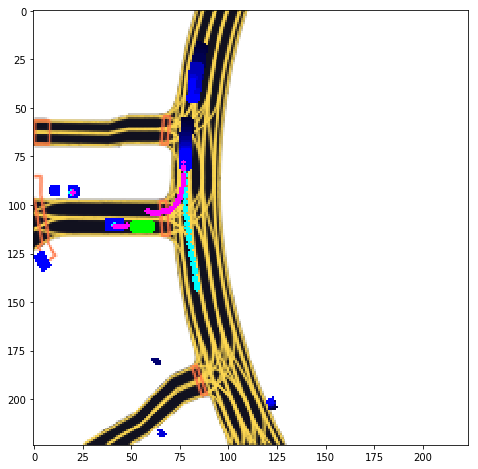

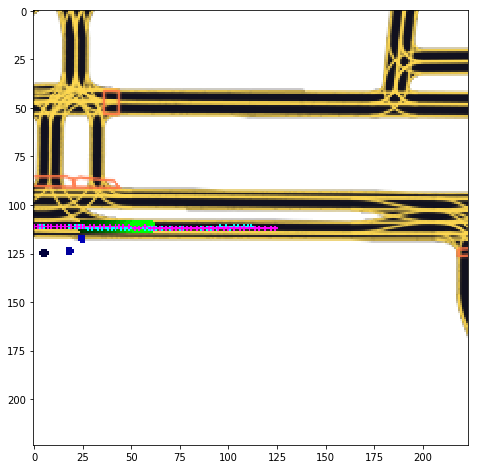

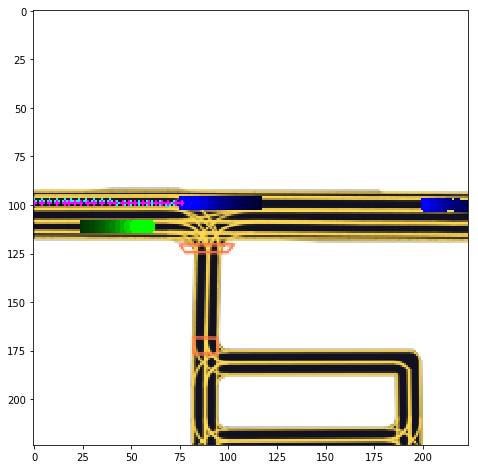

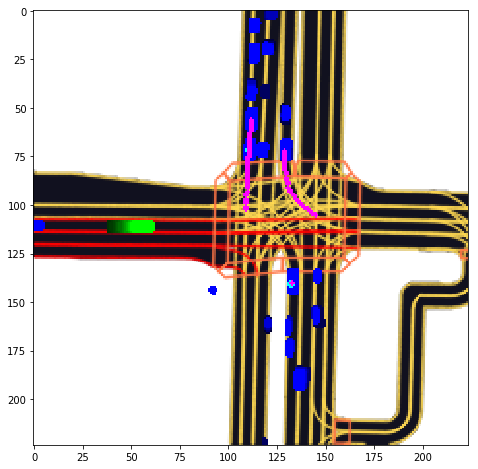

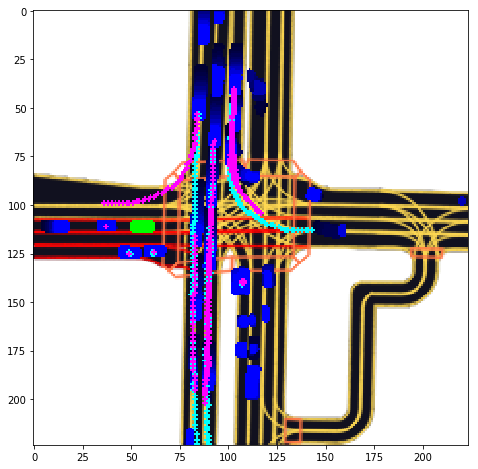

...

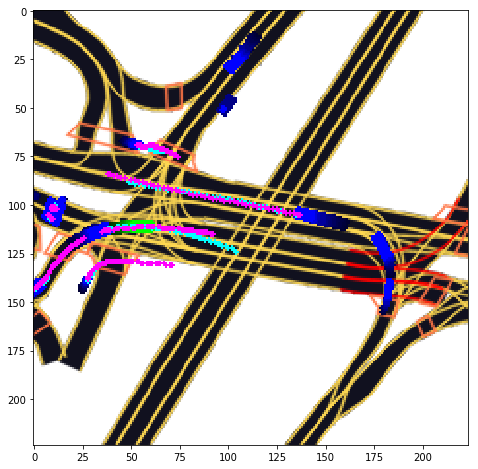

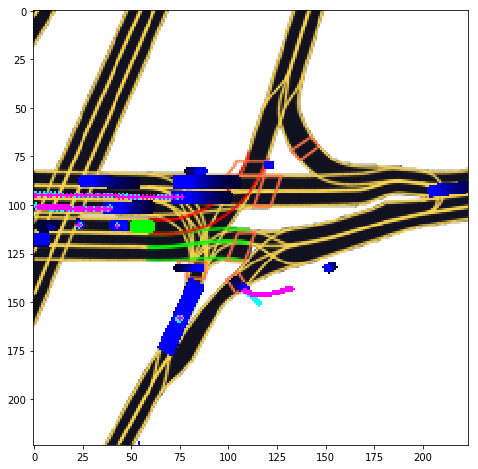

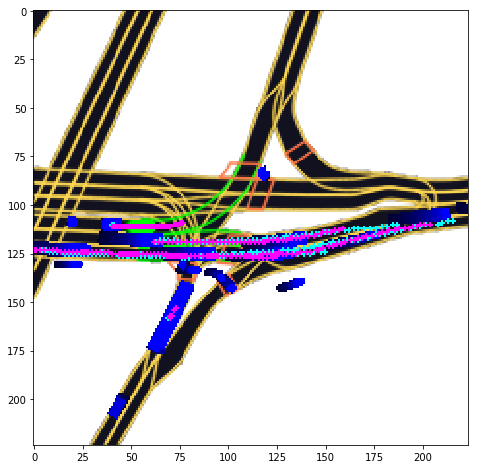

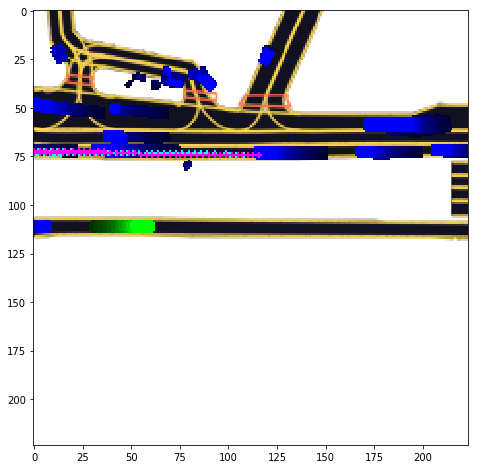

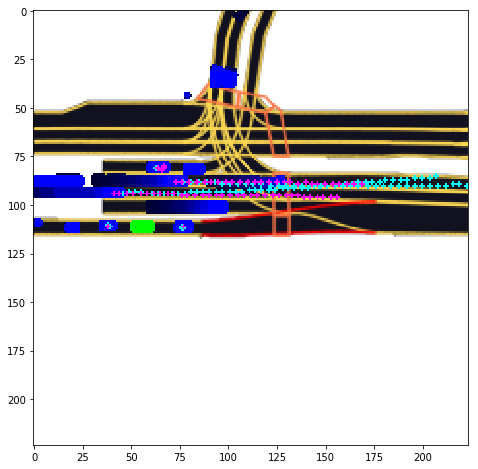

KeyboardInterrupt: 

In [55]:
model.eval()
torch.set_grad_enabled(False)
plt.rcParams['figure.figsize'] = 8, 8
# build a dict to retrieve future trajectories from GT
gt_rows = {}
for row in read_gt_csv(eval_gt_path):
    gt_rows[row["track_id"] + row["timestamp"]] = row["coord"]

eval_ego_dataset = EgoDataset(cfg, eval_dataset.dataset, rasterizer)

for frame_number in range(99, len(eval_zarr.frames), 100):  # start from last frame of scene_0 and increase by 100
    agent_indices = eval_dataset.get_frame_indices(frame_number) 
    if not len(agent_indices):
        continue

    # get AV point-of-view frame
    data_ego = eval_ego_dataset[frame_number]
    im_ego = rasterizer.to_rgb(data_ego["image"].transpose(1, 2, 0))
    center = np.asarray(cfg["raster_params"]["ego_center"]) * cfg["raster_params"]["raster_size"]
    
    predicted_positions1 = []
    predicted_positions2 = []
    predicted_positions3 = []
    target_positions = []

    for v_index in agent_indices:
        data_agent = eval_dataset[v_index]

        out_net, confi = model(torch.from_numpy(data_agent["image"]).unsqueeze(0).to(device))
        out_pos = out_net[0].reshape(-1, 2).detach().cpu().numpy()
        confi = confi[0].detach().cpu().numpy()
        # store absolute world coordinates
        out_pos = order(out_pos, confi)
        predicted_positions1.append(transform_points(out_pos[0], data_agent["world_from_agent"]))
        predicted_positions2.append(transform_points(out_pos[1], data_agent["world_from_agent"]))
        predicted_positions3.append(transform_points(out_pos[2], data_agent["world_from_agent"]))
        # retrieve target positions from the GT and store as absolute coordinates
        track_id, timestamp = data_agent["track_id"], data_agent["timestamp"]
        target_positions.append(gt_rows[str(track_id) + str(timestamp)] + data_agent["centroid"][:2])



    # convert coordinates to AV point-of-view so we can draw them
    predicted_positions1 = transform_points(np.concatenate(predicted_positions1), data_ego["raster_from_world"])
    predicted_positions2 = transform_points(np.concatenate(predicted_positions2), data_ego["raster_from_world"])
    predicted_positions3 = transform_points(np.concatenate(predicted_positions3), data_ego["raster_from_world"])
    target_positions = transform_points(np.concatenate(target_positions), data_ego["raster_from_world"])

    draw_trajectory(im_ego, predicted_positions1, (0, 255, 255))
#     draw_trajectory(im_ego, predicted_positions2, (0, 200, 200))
#     draw_trajectory(im_ego, predicted_positions3, (0, 128, 128))
    draw_trajectory(im_ego, target_positions, (255, 0, 255))

    plt.imshow(im_ego[::-1])
    plt.show()
    
#     break